In [1]:
!pip install torchsummary

In [1]:
import warnings
warnings.filterwarnings('ignore')

import cv2
import os
import numpy as np
import seaborn as sns
from PIL import Image
import torch
import torch.nn as nn
import torchvision
import functools
import torchvision.models as models
import torch.nn.functional as F
from torchsummary import summary
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torch.optim as optim
from torchvision import transforms
import matplotlib.pyplot as plt
from torchvision.utils import make_grid
from skimage import io, transform
from torch.autograd import Variable
from torchvision.utils import save_image
from torch.utils.tensorboard import SummaryWriter
from torchsummary import summary
from tqdm import tqdm
from torchvision.utils import save_image

In [2]:
IMG_WIDTH = 256
IMG_HEIGHT = 256
n_channels=1
# VAE latent size
latent_size = 50

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
n_gpus = torch.cuda.device_count() if device=='cuda' else 1
batch_size = 160 * n_gpus

lr = 0.0002

beta1=0.5
beta2=0.999

# 14 for 128x128
# 30 for 256x256
if IMG_WIDTH==256:
    patch_gan_output_size=30
elif IMG_WIDTH==128:
    patch_gan_output_size=14

    
DATA_PATH = '...'
SAVE_MODEL_PATH = ''
EPOCH_START=50
PATH_FILENAME_MODEL_GENERATOR='weights/256_generator_epoch_%d.pth' %EPOCH_START
PATH_FILENAME_MODEL_DISCRIMINATOR='weights/256_discriminator_epoch_%d.pth' %EPOCH_START

In [4]:
print(device)

cuda


In [5]:
# custom weights initialization called on generator and discriminator
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        torch.nn.init.normal_(m.weight, 1.0, 0.02)
        torch.nn.init.zeros_(m.bias)

In [6]:
class Split(object):
    def __call__(self, image):
        return transforms.Grayscale(num_output_channels=1)(image[2,:,:].view(1,IMG_WIDTH,IMG_HEIGHT)), transforms.Grayscale(num_output_channels=1)(image[1,:,:].view(1,IMG_WIDTH,IMG_HEIGHT))

In [7]:
dataset = ImageFolder(DATA_PATH, transform=transforms.Compose([
        transforms.Resize(IMG_WIDTH,interpolation=transforms.InterpolationMode.BICUBIC),
        #transforms.RandomHorizontalFlip(p=0.5),
        #transforms.Resize(upsample_transform, interpolation=transforms.InterpolationMode.BICUBIC),
        #transforms.RandomCrop((IMG_WIDTH,IMG_HEIGHT)),
        transforms.ToTensor(),
        transforms.Normalize(mean=(0.5,0.5,0.5), std=(0.5,0.5,0.5)),
        Split()
        ]))
dataloader = DataLoader(dataset, batch_size)

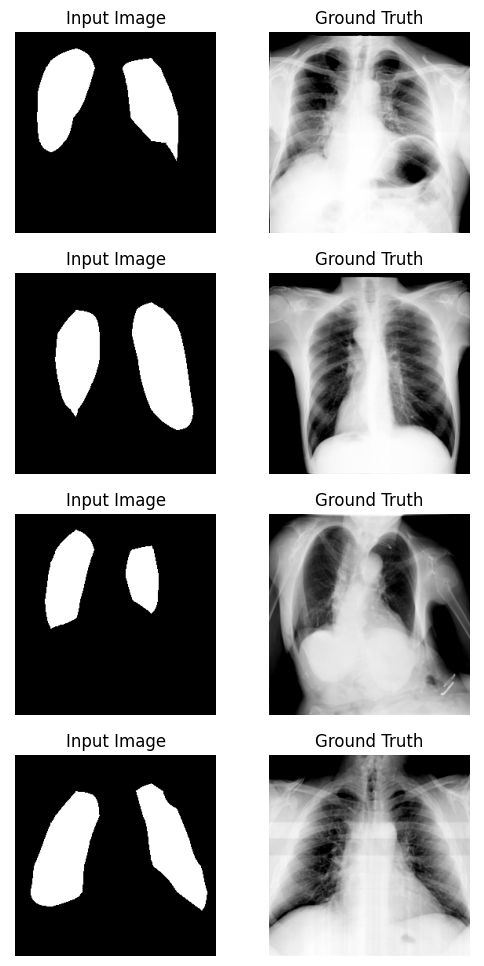

In [8]:
batch,_=next(iter(dataloader))
fig = plt.figure(figsize=(6, 12))
plt.axis("off")
title = ['Input Image', 'Ground Truth']

for j in range(4):
    for i in range(1,3):
        fig.add_subplot(4, 2, j*2+i)
        plt.imshow(batch[i-1][j][0], cmap='gray')
        plt.axis("off")
        plt.title(title[i-1])

In [9]:
class VAE(nn.Module):
    def __init__(self):
        super(VAE, self).__init__()

        self.encoder = nn.Sequential(
            nn.Conv2d(1,4, kernel_size=3, stride=1,padding=1),
            nn.BatchNorm2d(4),
            nn.ReLU(),
            nn.AvgPool2d(2),
            nn.Conv2d(4,8, kernel_size=3, stride=1,padding=1),
            nn.BatchNorm2d(8),
            nn.ReLU(),
            nn.AvgPool2d(2),
            nn.Conv2d(8,16, kernel_size=3, stride=1,padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.AvgPool2d(2),
            nn.Conv2d(16,32,kernel_size=3, stride=1,padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.AvgPool2d(2),
            nn.Conv2d(32,64,kernel_size=3, stride=1,padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.AvgPool2d(2),
            nn.Conv2d(64,128,kernel_size=3, stride=1,padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.AvgPool2d(2),
            nn.Conv2d(128,128,kernel_size=3, stride=1,padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            #nn.AvgPool2d(2),
            #nn.Conv2d(256,256,kernel_size=3, stride=1,padding=1),
            #nn.BatchNorm2d(256),
            #nn.ReLU(),
        )
        self.encoder_linear = nn.Linear(128*4*4, latent_size*2)
        self.decoder_linear = nn.Linear(latent_size, 128*4*4)
        self.flatten=nn.Flatten()
        self.unflatten=nn.Unflatten(1,(128,4,4))
        self.relu=nn.ReLU()
        self.decoder = nn.Sequential(
            #nn.Conv2d(256,256,kernel_size=3, stride=1,padding=1),
            #nn.BatchNorm2d(256),
            #nn.ReLU(),
            #nn.Upsample(scale_factor = 2),
            nn.Conv2d(128,128,kernel_size=3, stride=1,padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Upsample(scale_factor = 2),
            nn.Conv2d(128,64,kernel_size=3, stride=1,padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Upsample(scale_factor = 2),
            nn.Conv2d(64,32,kernel_size=3, stride=1,padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.Upsample(scale_factor = 2),
            nn.Conv2d(32,16,kernel_size=3, stride=1,padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.Upsample(scale_factor = 2),
            nn.Conv2d(16,8,kernel_size=3, stride=1,padding=1),
            nn.BatchNorm2d(8),
            nn.ReLU(),
            nn.Upsample(scale_factor = 2),
            nn.Conv2d(8,4,kernel_size=3, stride=1,padding=1),
            nn.BatchNorm2d(4),
            nn.ReLU(),
            nn.Upsample(scale_factor = 2),
            nn.Conv2d(4,1,kernel_size=3, stride=1,padding=1),
            nn.Tanh()
        )
        
    def encode(self, x):
        x = self.encoder(x)
        x=self.flatten(x)
        x=self.encoder_linear(x).view(x.shape[0],2,-1)
        mu = x[:, 0, :]
        logsigma = x[:, 1, :]
        
        return mu, logsigma#, idx
    
    def gaussian_sampler(self, mu, logsigma):
        if self.training:
            std = torch.exp(0.5 * logsigma) # standard deviation
            eps = torch.randn_like(std) # `randn_like` as we need the same size
            sample = mu + (eps * std) # sampling as if coming from the input space
            return sample
        else:
            return mu
    
    def decode(self, z):
        z=self.decoder_linear(z)
        z=self.relu(z)
        z=self.unflatten(z)
        z = self.decoder(z)
        reconstruction = torch.sigmoid(z)
        return reconstruction

    def forward(self, x):
        mu, logsigma=self.encode(x)
        reconstruction = self.decode(self.gaussian_sampler(mu, logsigma))

        return reconstruction, mu, logsigma
    
vae=VAE()
vae.to(device)
vae.load_state_dict(torch.load('weights_vae/vae_epoch_600.pth',map_location=torch.device('cpu')))
vae.eval()

VAE(
  (encoder): Sequential(
    (0): Conv2d(1, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): AvgPool2d(kernel_size=2, stride=2, padding=0)
    (4): Conv2d(4, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU()
    (7): AvgPool2d(kernel_size=2, stride=2, padding=0)
    (8): Conv2d(8, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU()
    (11): AvgPool2d(kernel_size=2, stride=2, padding=0)
    (12): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (14): ReLU()
    (15): AvgPool2d(kernel_size=2, stride=2, padding=0)
    (16): Conv2d(32, 64, kernel

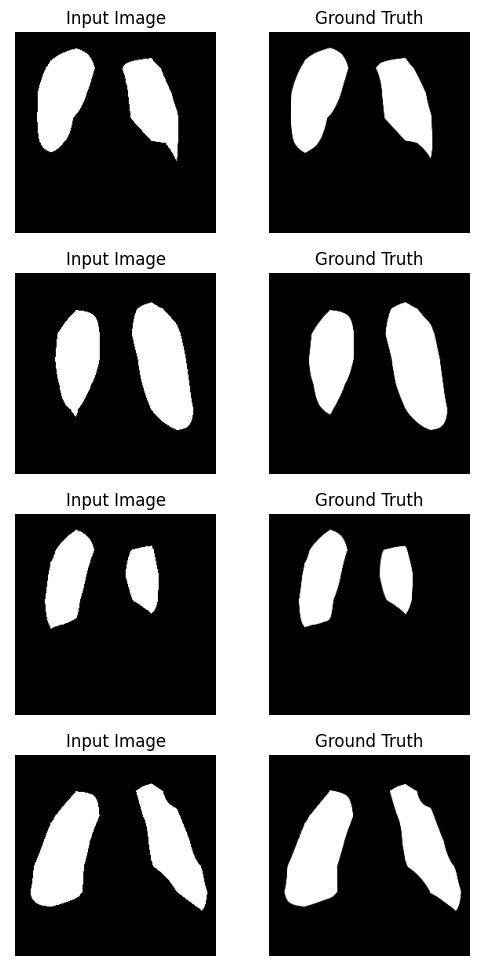

In [10]:
with torch.no_grad():
    batch[0].apply_(lambda x: (x+1.0)/2.0)
    batch_after_vae,_,_=vae(batch[0].to(device))
    
fig = plt.figure(figsize=(6, 12))
plt.axis("off")
title = ['Input Image', 'Ground Truth']

for j in range(4):
    for i in range(1,3):
        fig.add_subplot(4, 2, j*2+i)
        if i==1:
            plt.imshow(batch[i-1][j][0], cmap='gray')
        else:
            plt.imshow(batch_after_vae[j][0].cpu(),cmap='gray')
        plt.axis("off")
        plt.title(title[i-1])

In [3]:
def get_norm_layer():
    """Return a normalization layer
       For BatchNorm, we use learnable affine parameters and track running statistics (mean/stddev).
    """
    norm_type = 'batch'
    if norm_type == 'batch':
        norm_layer = functools.partial(nn.BatchNorm2d, affine=True, track_running_stats=True)
    return norm_layer

In [4]:
class UnetGenerator(nn.Module):
    """Create a Unet-based generator"""

    def __init__(self, input_nc, output_nc, nf=64, norm_layer=nn.BatchNorm2d, use_dropout=False):
        """Construct a Unet generator
        Parameters:
            input_nc (int)  -- the number of channels in input images
            output_nc (int) -- the number of channels in output images
            nf (int)       -- the number of filters in the last conv layer
            norm_layer      -- normalization layer
        We construct the U-Net from the innermost layer to the outermost layer.
        It is a recursive process.
        """
        super(UnetGenerator, self).__init__()
        # construct unet structure
        unet_block = UnetSkipConnectionBlock(nf * 8, nf * 8, input_nc=None, submodule=None, norm_layer=norm_layer, innermost=True)  # add the innermost layer
        
        # add intermediate layers with ngf * 8 filters
        if IMG_WIDTH==256:
            unet_block = UnetSkipConnectionBlock(nf * 8, nf * 8, input_nc=None, submodule=unet_block, norm_layer=norm_layer, use_dropout=use_dropout)
           
        unet_block = UnetSkipConnectionBlock(nf * 8, nf * 8, input_nc=None, submodule=unet_block, norm_layer=norm_layer, use_dropout=use_dropout)
        unet_block = UnetSkipConnectionBlock(nf * 8, nf * 8, input_nc=None, submodule=unet_block, norm_layer=norm_layer, use_dropout=use_dropout)
        
        # gradually reduce the number of filters from nf * 8 to nf
        unet_block = UnetSkipConnectionBlock(nf * 4, nf * 8, input_nc=None, submodule=unet_block, norm_layer=norm_layer)
        unet_block = UnetSkipConnectionBlock(nf * 2, nf * 4, input_nc=None, submodule=unet_block, norm_layer=norm_layer)
        unet_block = UnetSkipConnectionBlock(nf, nf * 2, input_nc=None, submodule=unet_block, norm_layer=norm_layer)
        self.model = UnetSkipConnectionBlock(output_nc, nf, input_nc=input_nc, submodule=unet_block, outermost=True, norm_layer=norm_layer)  # add the outermost layer

    def forward(self, input):
        """Standard forward"""
        return self.model(input)

In [5]:
class UnetSkipConnectionBlock(nn.Module):
    """Defines the Unet submodule with skip connection.
        X -------------------identity----------------------
        |-- downsampling -- |submodule| -- upsampling --|
    """

    def __init__(self, outer_nc, inner_nc, input_nc=None,
                 submodule=None, outermost=False, innermost=False, norm_layer=nn.BatchNorm2d, use_dropout=False):
        """Construct a Unet submodule with skip connections.
        Parameters:
            outer_nc (int) -- the number of filters in the outer conv layer
            inner_nc (int) -- the number of filters in the inner conv layer
            input_nc (int) -- the number of channels in input images/features
            submodule (UnetSkipConnectionBlock) -- previously defined submodules
            outermost (bool)    -- if this module is the outermost module
            innermost (bool)    -- if this module is the innermost module
            norm_layer          -- normalization layer
            use_dropout (bool)  -- if use dropout layers.
        """
        super(UnetSkipConnectionBlock, self).__init__()
        self.outermost = outermost
        if input_nc is None:
            input_nc = outer_nc
        downconv = nn.Conv2d(input_nc, inner_nc, kernel_size=4,
                             stride=2, padding=1, bias=False)
        downrelu = nn.LeakyReLU(0.2, True)
        downnorm = norm_layer(inner_nc)
        uprelu = nn.ReLU(True)
        upnorm = norm_layer(outer_nc)

        if outermost:
            upconv = nn.ConvTranspose2d(inner_nc * 2, outer_nc,
                                        kernel_size=4, stride=2,
                                        padding=1)
            down = [downconv]
            up = [uprelu, upconv, nn.Tanh()]
            model = down + [submodule] + up
        elif innermost:
            upconv = nn.ConvTranspose2d(inner_nc, outer_nc,
                                        kernel_size=4, stride=2,
                                        padding=1, bias=False)
            down = [downrelu, downconv]
            up = [uprelu, upconv, upnorm]
            model = down + up
        else:
            upconv = nn.ConvTranspose2d(inner_nc * 2, outer_nc,
                                        kernel_size=4, stride=2,
                                        padding=1, bias=False)
            down = [downrelu, downconv, downnorm]
            up = [uprelu, upconv, upnorm]

            if use_dropout:
                model = down + [submodule] + up + [nn.Dropout(0.5)]
            else:
                model = down + [submodule] + up

        self.model = nn.Sequential(*model)

    def forward(self, x):
        if self.outermost:
            return self.model(x)
        else:   # add skip connections
            return torch.cat([x, self.model(x)], 1)

In [6]:
norm_layer = get_norm_layer()

In [7]:
generator = UnetGenerator(n_channels, n_channels, 64, norm_layer=norm_layer, use_dropout=False).to(device)
generator.apply(weights_init)

#generator = torch.nn.DataParallel(generator)  # multi-GPUs

In [8]:
summary(generator,(n_channels,IMG_WIDTH,IMG_HEIGHT), device = 'cpu')

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           1,024
         LeakyReLU-2         [-1, 64, 128, 128]               0
            Conv2d-3          [-1, 128, 64, 64]         131,072
       BatchNorm2d-4          [-1, 128, 64, 64]             256
         LeakyReLU-5          [-1, 128, 64, 64]               0
            Conv2d-6          [-1, 256, 32, 32]         524,288
       BatchNorm2d-7          [-1, 256, 32, 32]             512
         LeakyReLU-8          [-1, 256, 32, 32]               0
            Conv2d-9          [-1, 512, 16, 16]       2,097,152
      BatchNorm2d-10          [-1, 512, 16, 16]           1,024
        LeakyReLU-11          [-1, 512, 16, 16]               0
           Conv2d-12            [-1, 512, 8, 8]       4,194,304
      BatchNorm2d-13            [-1, 512, 8, 8]           1,024
        LeakyReLU-14            [-1, 51

In [9]:
class Discriminator(nn.Module):
    """Defines a PatchGAN discriminator"""

    def __init__(self, input_nc, ndf=64, n_layers=3, norm_layer=nn.BatchNorm2d):
        """Construct a PatchGAN discriminator
        Parameters:
            input_nc (int)  -- the number of channels in input images
            ndf (int)       -- the number of filters in the last conv layer
            n_layers (int)  -- the number of conv layers in the discriminator
            norm_layer      -- normalization layer
        """
        super(Discriminator, self).__init__()
        kw = 4
        padw = 1
        sequence = [nn.Conv2d(input_nc, ndf, kernel_size=kw, stride=2, padding=padw), nn.LeakyReLU(0.2, True)]
        nf_mult = 1
        nf_mult_prev = 1
        for n in range(1, n_layers):  # gradually increase the number of filters
            nf_mult_prev = nf_mult
            nf_mult = min(2 ** n, 8)
            sequence += [
                nn.Conv2d(ndf * nf_mult_prev, ndf * nf_mult, kernel_size=kw, stride=2, padding=padw, bias=False),
                norm_layer(ndf * nf_mult),
                nn.LeakyReLU(0.2, True)
            ]

        nf_mult_prev = nf_mult
        nf_mult = min(2 ** n_layers, 8)
        sequence += [
            nn.Conv2d(ndf * nf_mult_prev, ndf * nf_mult, kernel_size=kw, stride=1, padding=padw, bias=False),
            norm_layer(ndf * nf_mult),
            nn.LeakyReLU(0.2, True)
        ]

        sequence += [nn.Conv2d(ndf * nf_mult, 1, kernel_size=kw, stride=1, padding=padw), nn.Sigmoid()]  # output 1 channel prediction map
        self.model = nn.Sequential(*sequence)

    def forward(self, input):
        """Standard forward."""
        return self.model(input)

In [10]:
discriminator = Discriminator(n_channels*2, 64, n_layers=3, norm_layer=norm_layer).to(device)
discriminator.apply(weights_init)
#discriminator = torch.nn.DataParallel(discriminator)  # multi-GPUs

In [11]:
summary(discriminator,(n_channels*2,IMG_WIDTH,IMG_HEIGHT))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           2,112
         LeakyReLU-2         [-1, 64, 128, 128]               0
            Conv2d-3          [-1, 128, 64, 64]         131,072
       BatchNorm2d-4          [-1, 128, 64, 64]             256
         LeakyReLU-5          [-1, 128, 64, 64]               0
            Conv2d-6          [-1, 256, 32, 32]         524,288
       BatchNorm2d-7          [-1, 256, 32, 32]             512
         LeakyReLU-8          [-1, 256, 32, 32]               0
            Conv2d-9          [-1, 512, 31, 31]       2,097,152
      BatchNorm2d-10          [-1, 512, 31, 31]           1,024
        LeakyReLU-11          [-1, 512, 31, 31]               0
           Conv2d-12            [-1, 1, 30, 30]           8,193
          Sigmoid-13            [-1, 1, 30, 30]               0
Total params: 2,764,609
Trainable param

In [20]:
adversarial_loss = nn.BCELoss() 
l1_loss = nn.L1Loss()

def generator_loss(generated_image, target_img, G, real_target):
    gen_loss = adversarial_loss(G, real_target)
    l1_l = l1_loss(generated_image, target_img)
    gen_total_loss = gen_loss + (100 * l1_l)
    return gen_total_loss

def discriminator_loss(output, label):
    disc_loss = adversarial_loss(output, label)
    return disc_loss

In [21]:
def show_scores_heatmap(real,fake,x=patch_gan_output_size,y=patch_gan_output_size):
    fig, (ax,ax2) = plt.subplots(ncols=2, figsize=(6, 2))
    fig.subplots_adjust(wspace=0.1)
    sns.heatmap(real.view(x,y),vmin=0,vmax=1,ax=ax)
    sns.heatmap(fake.view(x,y),vmin=0,vmax=1,ax=ax2)
    ax.axis('off')
    ax2.axis('off')
    ax.set_title('Real Score')
    ax2.set_title('Fake Score')
    ax2.yaxis.tick_right()
    ax2.tick_params(rotation=0)
    plt.show()

def show_sample(batch):
    fig = plt.figure(figsize=(12, 4))
    plt.axis("off")
    plt.title('Input->Generated')
    for i in range(2):
        for j in range(1,7):
            fig.add_subplot(2, 6, i*6+j)
            plt.imshow(np.transpose(batch[i][j-1],(1,2,0)), cmap='gray')
            plt.axis("off")
    plt.subplots_adjust(wspace=0.05,hspace=0)
    plt.show()

In [22]:
model = {
    "discriminator": discriminator,
    "generator": generator
}

criterion = {
    "discriminator": discriminator_loss,
    "generator": generator_loss
}

In [23]:
def fit(model, criterion, epochs, lr, epochs_start=0,uploaded=False):
    if epochs_start!=0 and not uploaded:
        model['generator'].load_state_dict(torch.load(PATH_FILENAME_MODEL_GENERATOR))
        model['discriminator'].load_state_dict(torch.load(PATH_FILENAME_MODEL_DISCRIMINATOR))
        print('Model uploaded')
        
    model["discriminator"].to(device)
    model["generator"].to(device)
    model["discriminator"].train()
    model["generator"].train()
    torch.cuda.empty_cache()
    
    losses_g,losses_d = [],[]
    losses_g_per_batch,losses_d_per_batch=[],[]
    mean_scores_fake,mean_scores_real=[],[]
    mean_scores_fake_per_batch,mean_scores_real_per_batch=[],[]
    
    optimizer = {
        "discriminator": torch.optim.Adam(model["discriminator"].parameters(), 
                                          lr=lr, betas=(beta1, beta2)),
        "generator": torch.optim.Adam(model["generator"].parameters(),
                                      lr=lr, betas=(beta1, beta2))
    }
        
    for epoch in tqdm(range(epochs)):
        loss_d_per_epoch = []
        loss_g_per_epoch = []
        mean_score_real_per_epoch = []
        mean_score_fake_per_epoch = []
        
        for (inp, tar), _ in dataloader:
            if inp.shape[0]!=batch_size:
                continue
            input_img=inp.to(device)
            target_img=tar.to(device)
            
            with torch.no_grad():
                input_img=(input_img+1.0)/2.0
                input_img, _, _=vae(input_img)
                input_img=(input_img-0.5)*2
            
            # discriminator step           
            optimizer["discriminator"].zero_grad()
            generated_image = model['generator'](input_img)
            
            disc_inp_fake = torch.cat((input_img, generated_image), 1)
            
            real_target = Variable(torch.ones(batch_size, 1, patch_gan_output_size, patch_gan_output_size).to(device))
            fake_target = Variable(torch.zeros(batch_size, 1, patch_gan_output_size, patch_gan_output_size).to(device))
            
            D_fake = model['discriminator'](disc_inp_fake.detach())
            
            D_fake_loss = criterion['discriminator'](D_fake, fake_target)
            
            disc_inp_real = torch.cat((input_img, target_img),1)
                                  
            D_real = model['discriminator'](disc_inp_real)
            D_real_loss = discriminator_loss(D_real,  real_target)
            
            D_total_loss = (D_real_loss + D_fake_loss) / 2
            D_total_loss.backward()
            optimizer['discriminator'].step()
                        
            # generator step
            
            optimizer['generator'].zero_grad()
            fake_gen = torch.cat((input_img, generated_image), 1)
            
            G = model['discriminator'](fake_gen)
            
            G_loss = criterion['generator'](generated_image, target_img, G, real_target)                                 
            G_loss.backward()
            optimizer['generator'].step()
            
            loss_d_per_epoch.append(D_total_loss.item())
            losses_d_per_batch.append(D_total_loss.item())
            loss_g_per_epoch.append(G_loss.item())
            losses_g_per_batch.append(G_loss.item())
            mean_score_real_per_epoch.append(torch.mean(D_real).item())
            mean_scores_real_per_batch.append(torch.mean(D_real).item())
            mean_score_fake_per_epoch.append(torch.mean(D_fake).item())
            mean_scores_fake_per_batch.append(torch.mean(D_fake).item())
        
        losses_g.append(np.mean(loss_g_per_epoch))
        losses_d.append(np.mean(loss_d_per_epoch))
        mean_scores_real.append(np.mean(mean_score_real_per_epoch))
        mean_scores_fake.append(np.mean(mean_score_fake_per_epoch))
        
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}".format(
            epoch+1+epochs_start, epochs+epochs_start, 
            losses_g[-1], losses_d[-1]))
        
        show_scores_heatmap(torch.mean(D_real,dim=0).detach().cpu(),torch.mean(D_fake,dim=0).detach().cpu())
        
        # example
        show_sample(torch.stack((input_img, generated_image)).detach().cpu())
        
        if (epoch+1+epochs_start)%5==0:
            print('Saving models')
            torch.save(generator.state_dict(),'256_generator_epoch_%d.pth' % (epoch+1+epochs_start))
            torch.save(discriminator.state_dict(),'256_discriminator_epoch_%d.pth' % (epoch+1+epochs_start))
            print('Models saved! Epoch: %d' % (epoch+1+epochs_start))
            
    return losses_g, losses_d, losses_g_per_batch, losses_d_per_batch, mean_scores_fake, mean_scores_real, mean_scores_fake_per_batch, mean_scores_real_per_batch

In [24]:
lr=0.0002
epochs=50

Model uploaded


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [51/100], loss_g: 8.9504, loss_d: 0.6233


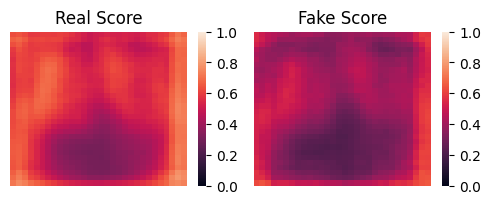

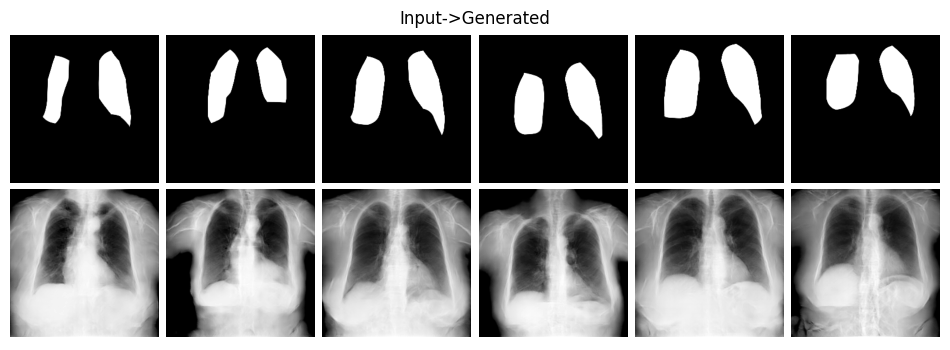

  2%|▏         | 1/50 [14:42<12:01:03, 882.93s/it]

Epoch [52/100], loss_g: 8.8661, loss_d: 0.6963


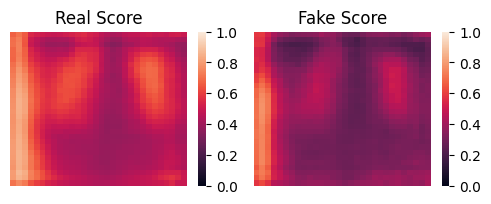

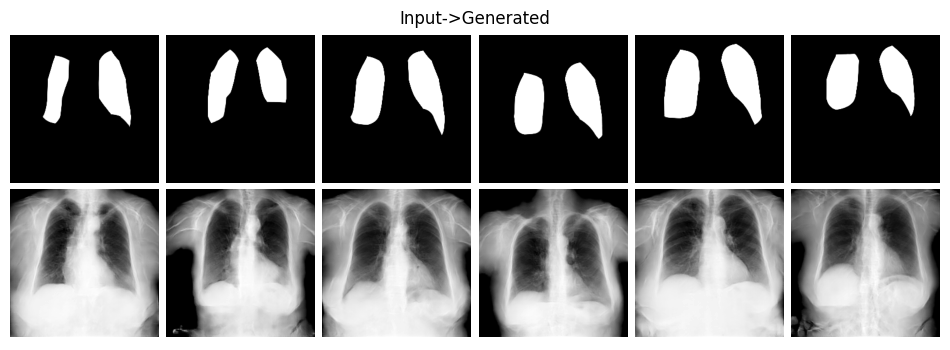

  4%|▍         | 2/50 [25:24<9:52:50, 741.05s/it] 

Epoch [53/100], loss_g: 8.8633, loss_d: 0.6148


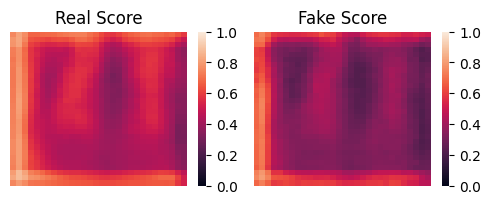

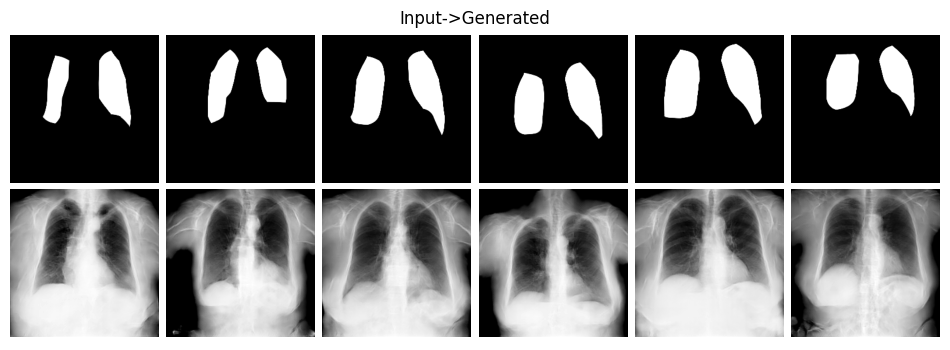

  6%|▌         | 3/50 [36:05<9:04:37, 695.27s/it]

Epoch [54/100], loss_g: 8.5740, loss_d: 0.7267


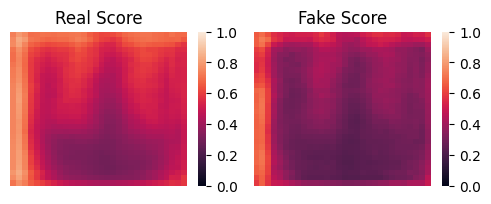

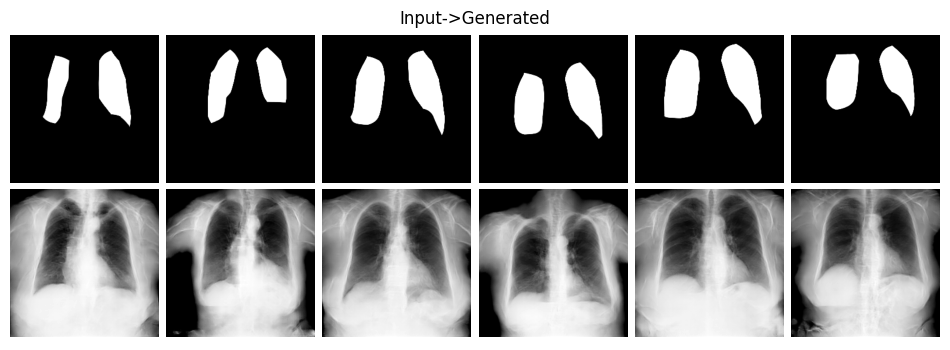

  8%|▊         | 4/50 [46:47<8:36:49, 674.12s/it]

Epoch [55/100], loss_g: 8.6587, loss_d: 0.6107


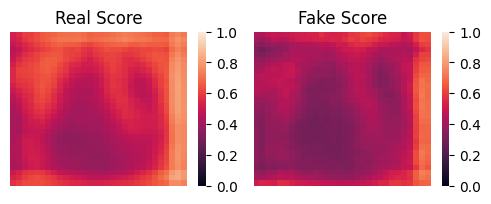

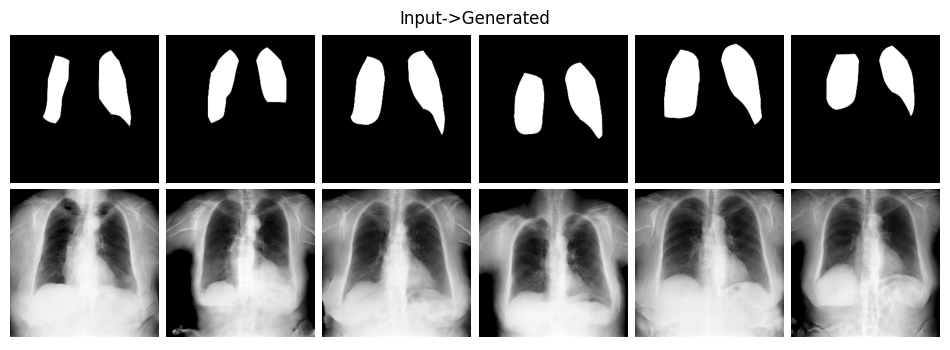

Saving models


 10%|█         | 5/50 [57:30<8:17:13, 662.96s/it]

Models saved! Epoch: 55
Epoch [56/100], loss_g: 8.5979, loss_d: 0.6110


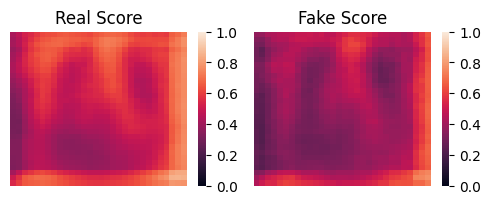

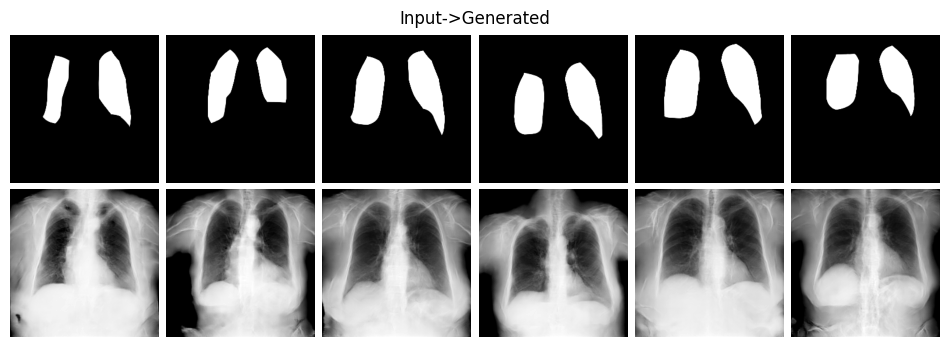

 12%|█▏        | 6/50 [1:08:25<8:04:08, 660.20s/it]

Epoch [57/100], loss_g: 8.4179, loss_d: 0.6814


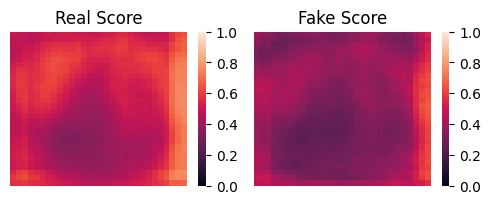

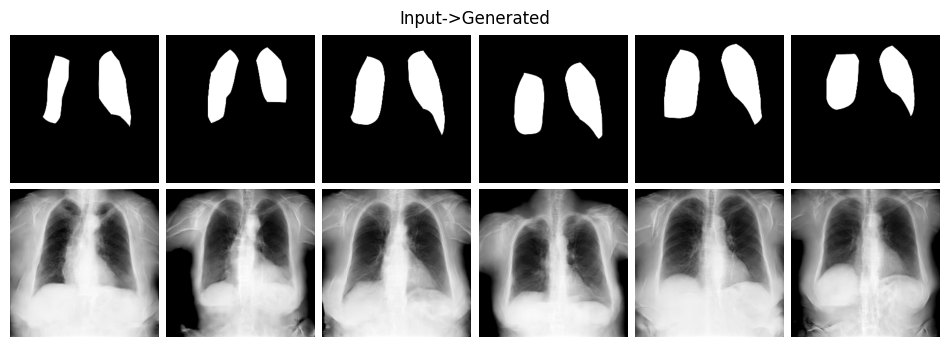

 14%|█▍        | 7/50 [1:19:10<7:49:43, 655.44s/it]

Epoch [58/100], loss_g: 8.4532, loss_d: 0.6214


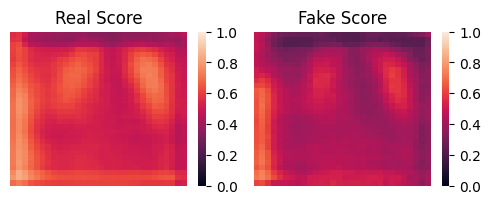

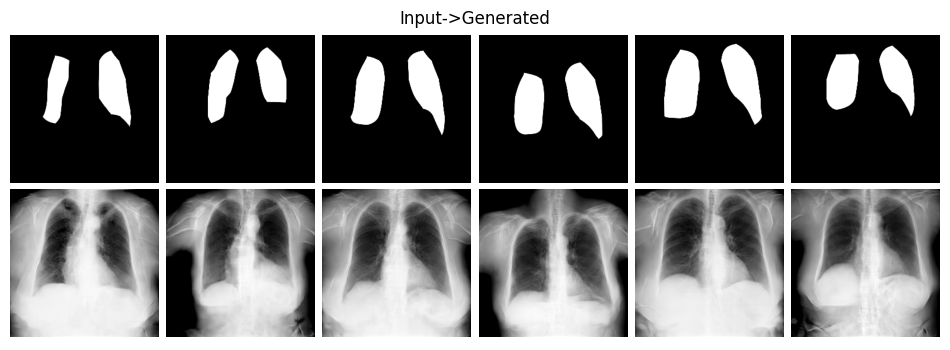

 16%|█▌        | 8/50 [1:29:55<7:36:24, 652.01s/it]

Epoch [59/100], loss_g: 8.2561, loss_d: 0.7770


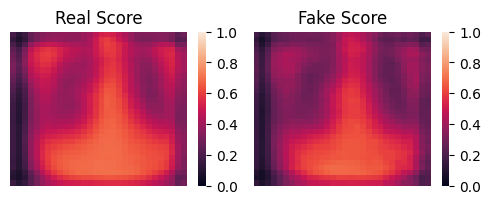

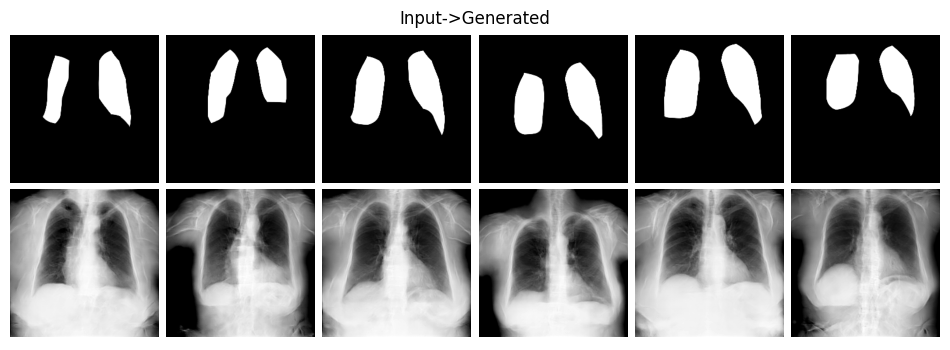

 18%|█▊        | 9/50 [1:40:38<7:23:32, 649.08s/it]

Epoch [60/100], loss_g: 8.3359, loss_d: 0.6123


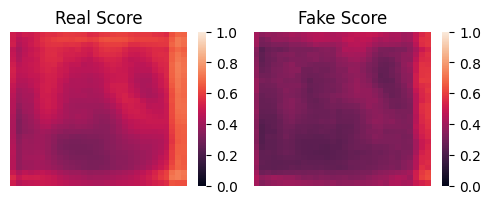

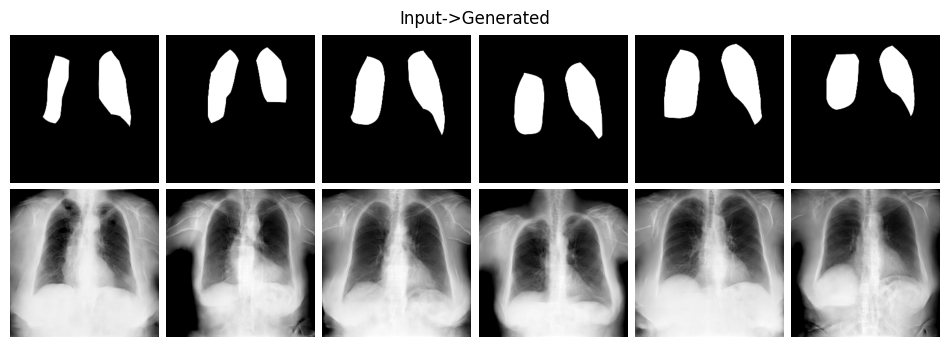

Saving models


 20%|██        | 10/50 [1:51:20<7:11:17, 646.93s/it]

Models saved! Epoch: 60
Epoch [61/100], loss_g: 8.3084, loss_d: 0.6125


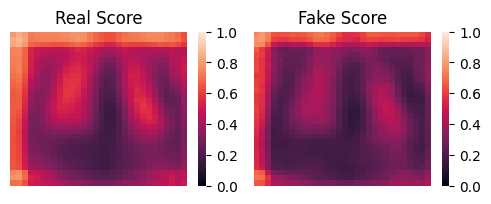

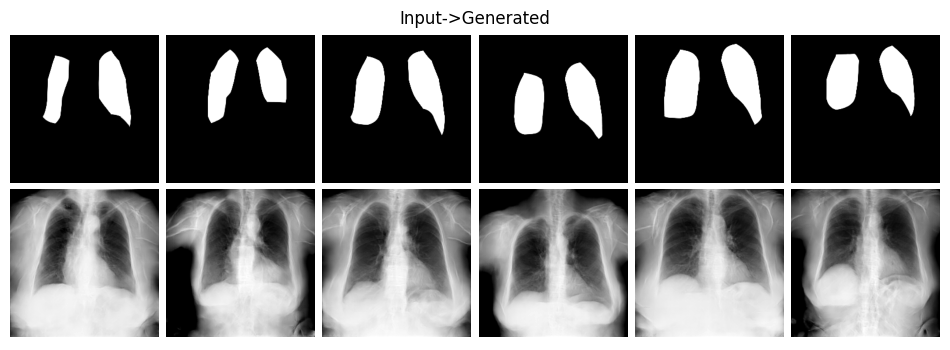

 22%|██▏       | 11/50 [2:01:57<6:58:32, 643.92s/it]

Epoch [62/100], loss_g: 8.2602, loss_d: 0.6146


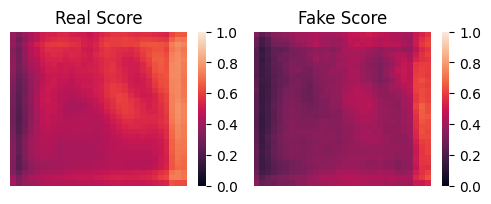

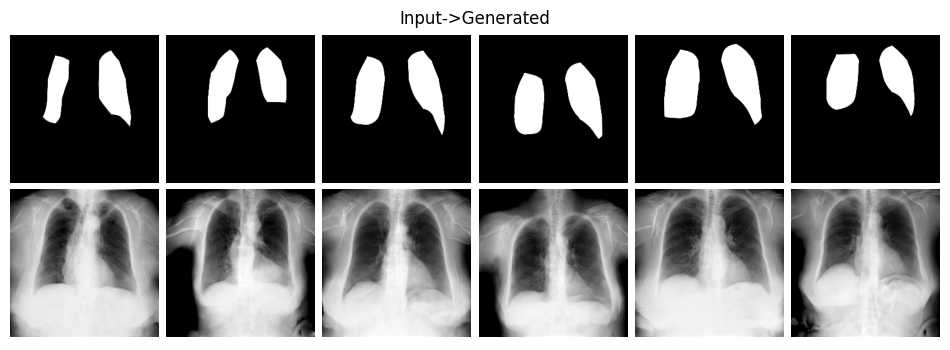

 24%|██▍       | 12/50 [2:12:34<6:46:25, 641.74s/it]

Epoch [63/100], loss_g: 8.0612, loss_d: 0.6800


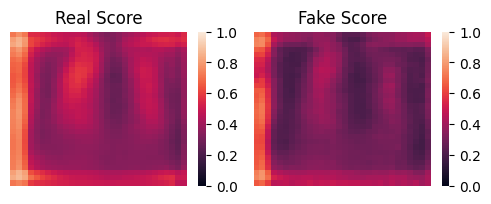

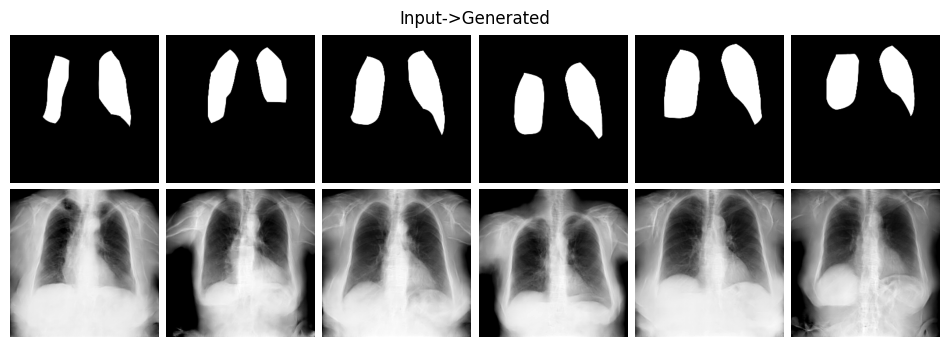

 26%|██▌       | 13/50 [2:23:11<6:34:57, 640.48s/it]

Epoch [64/100], loss_g: 8.0930, loss_d: 0.6438


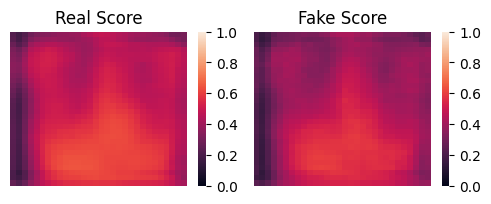

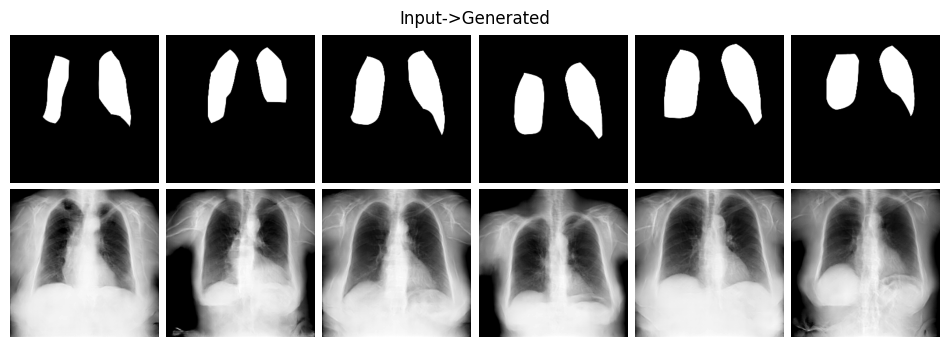

 28%|██▊       | 14/50 [2:33:49<6:23:47, 639.65s/it]

Epoch [65/100], loss_g: 8.0684, loss_d: 0.6180


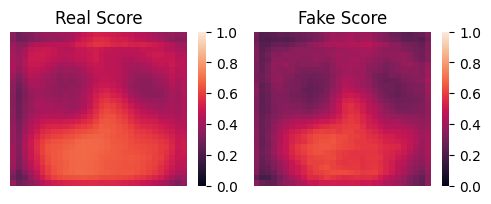

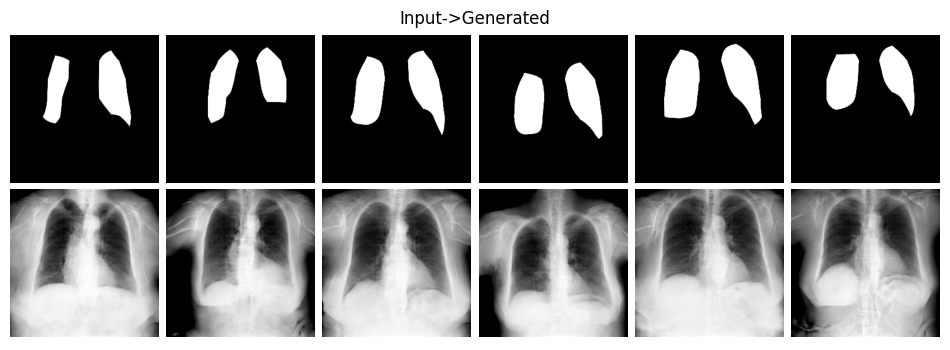

Saving models


 30%|███       | 15/50 [2:44:27<6:12:50, 639.16s/it]

Models saved! Epoch: 65
Epoch [66/100], loss_g: 8.1274, loss_d: 0.6564


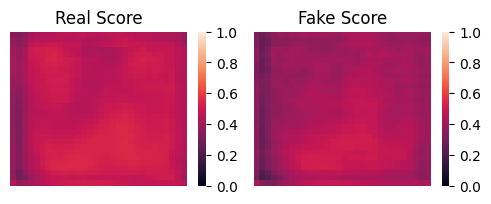

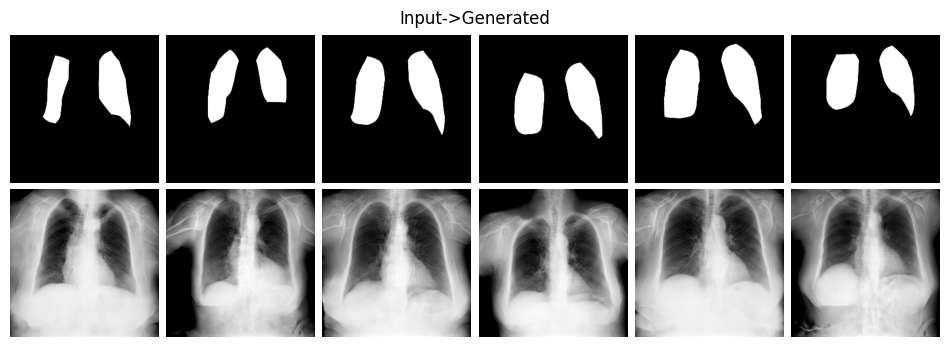

 32%|███▏      | 16/50 [2:55:07<6:02:21, 639.44s/it]

Epoch [67/100], loss_g: 8.4061, loss_d: 0.5735


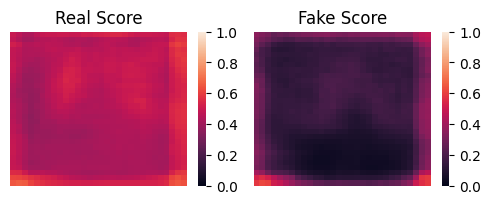

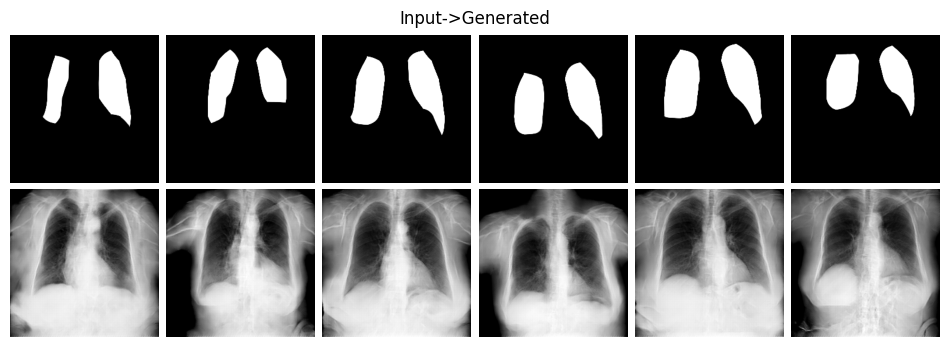

 34%|███▍      | 17/50 [3:05:45<5:51:29, 639.06s/it]

Epoch [68/100], loss_g: 8.4203, loss_d: 0.5667


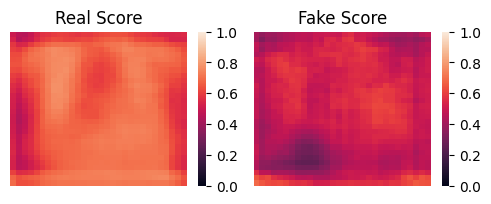

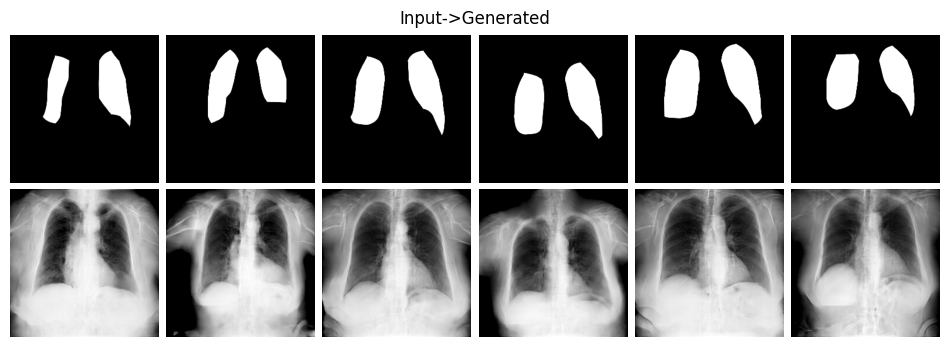

 36%|███▌      | 18/50 [3:16:24<5:40:49, 639.06s/it]

Epoch [69/100], loss_g: 8.3293, loss_d: 0.5776


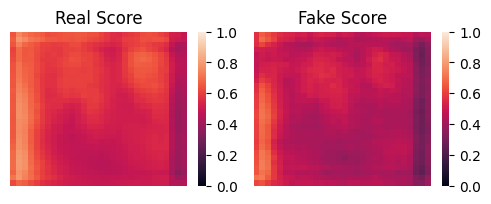

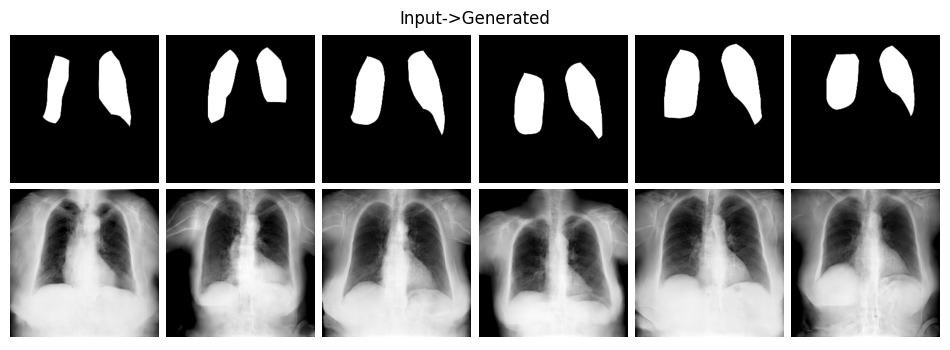

 38%|███▊      | 19/50 [3:27:04<5:30:20, 639.37s/it]

Epoch [70/100], loss_g: 8.1379, loss_d: 0.5649


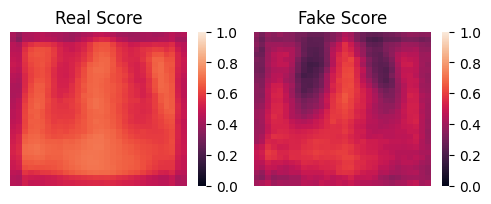

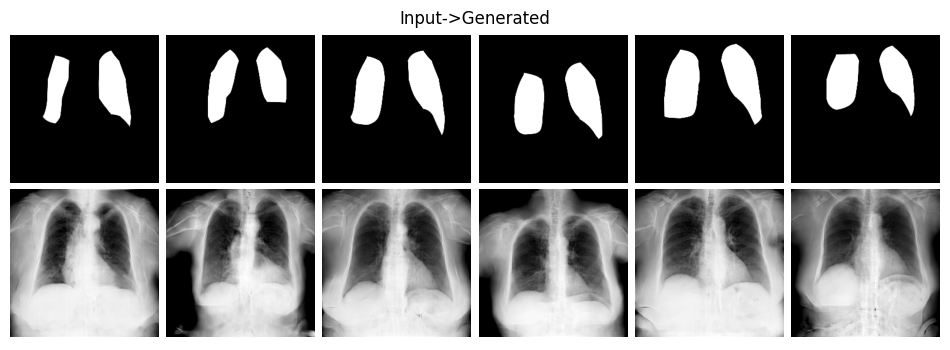

Saving models


 40%|████      | 20/50 [3:37:45<5:19:54, 639.82s/it]

Models saved! Epoch: 70
Epoch [71/100], loss_g: 8.0806, loss_d: 0.6701


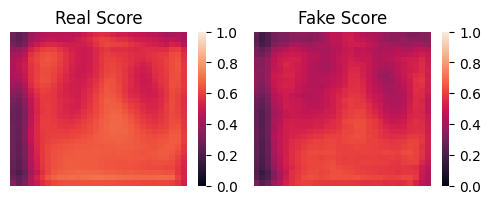

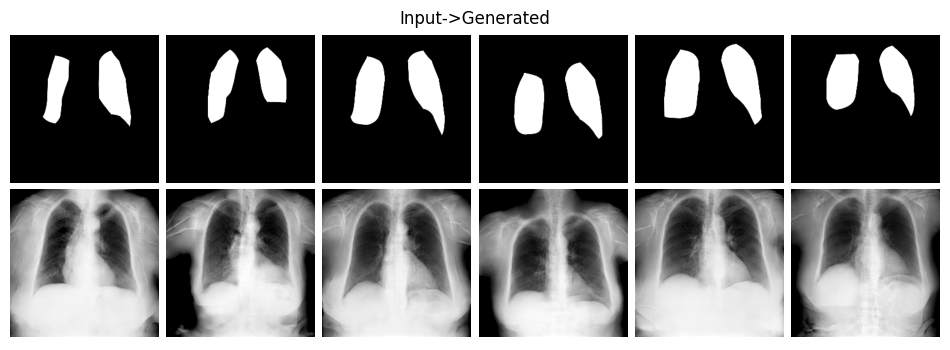

 42%|████▏     | 21/50 [3:48:22<5:08:45, 638.79s/it]

Epoch [72/100], loss_g: 7.7733, loss_d: 0.5959


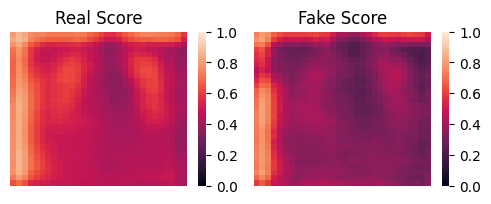

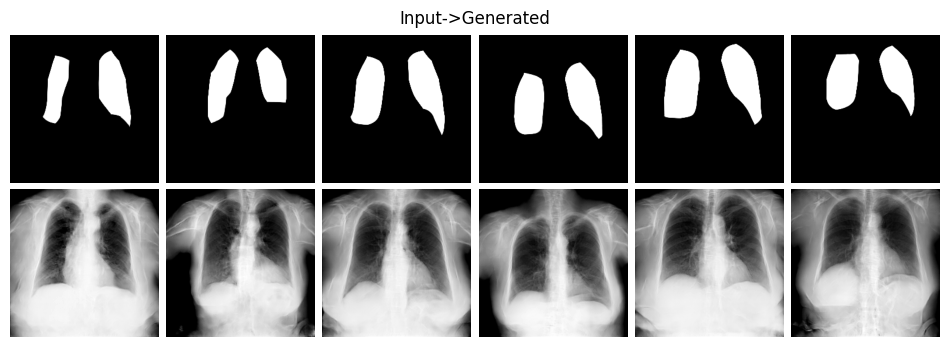

 44%|████▍     | 22/50 [3:58:59<4:57:55, 638.41s/it]

Epoch [73/100], loss_g: 7.7941, loss_d: 0.6184


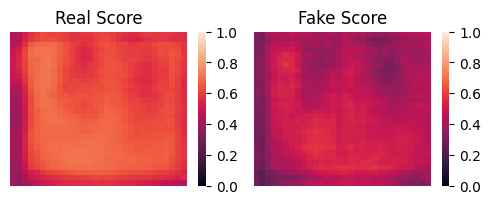

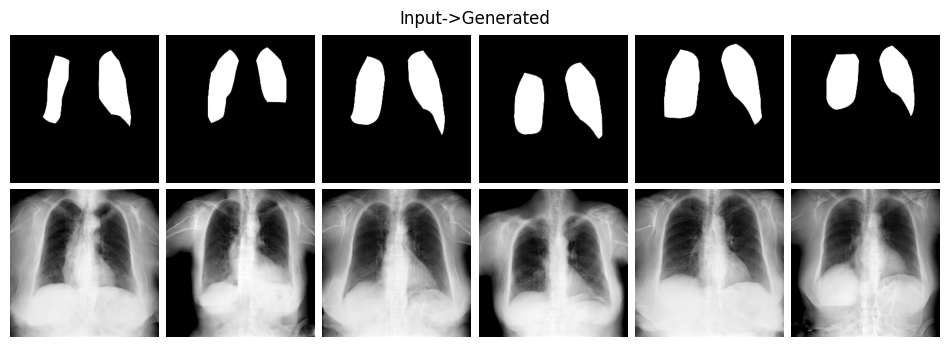

 46%|████▌     | 23/50 [4:09:39<4:47:28, 638.82s/it]

Epoch [74/100], loss_g: 8.1477, loss_d: 0.5565


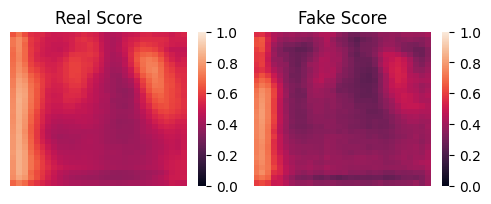

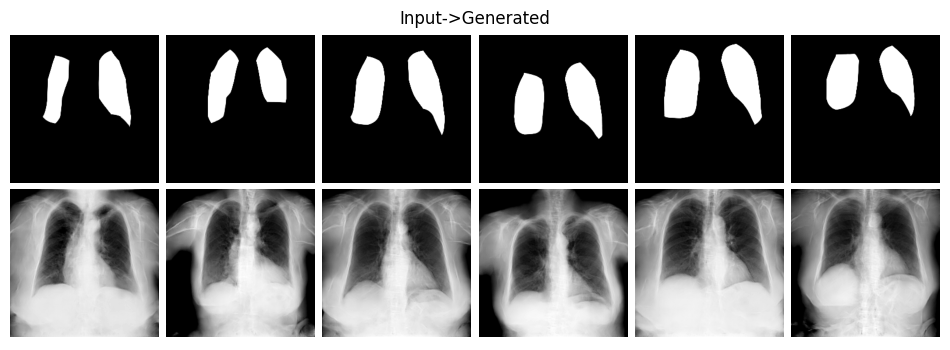

 48%|████▊     | 24/50 [4:20:21<4:37:11, 639.68s/it]

Epoch [75/100], loss_g: 8.0247, loss_d: 0.5617


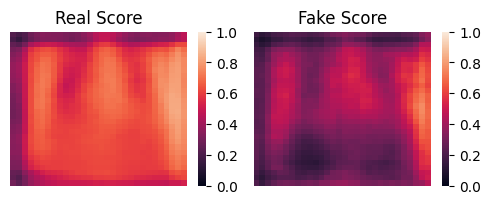

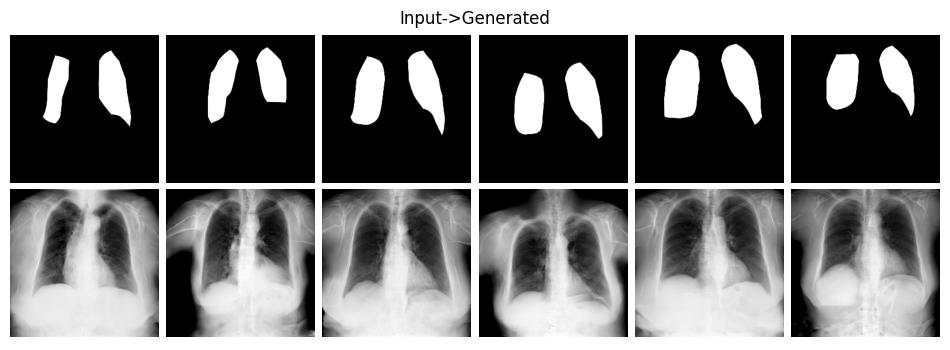

Saving models


 50%|█████     | 25/50 [4:30:59<4:26:20, 639.21s/it]

Models saved! Epoch: 75
Epoch [76/100], loss_g: 8.1610, loss_d: 0.8897


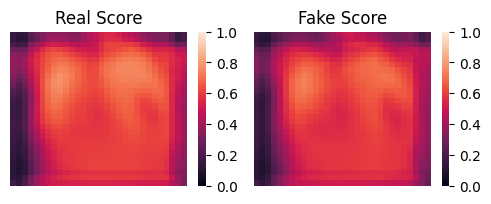

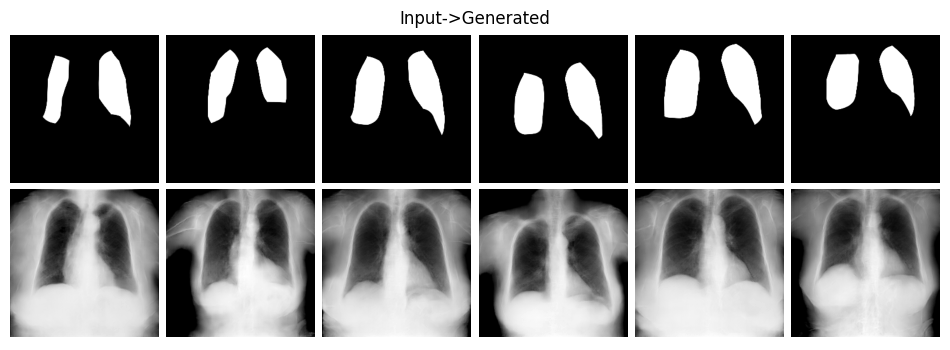

 52%|█████▏    | 26/50 [4:41:39<4:15:52, 639.69s/it]

Epoch [77/100], loss_g: 7.2714, loss_d: 0.6556


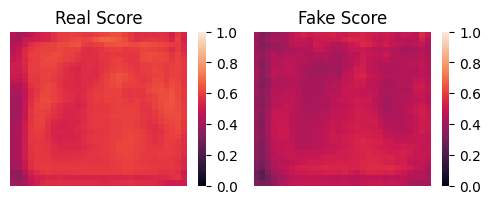

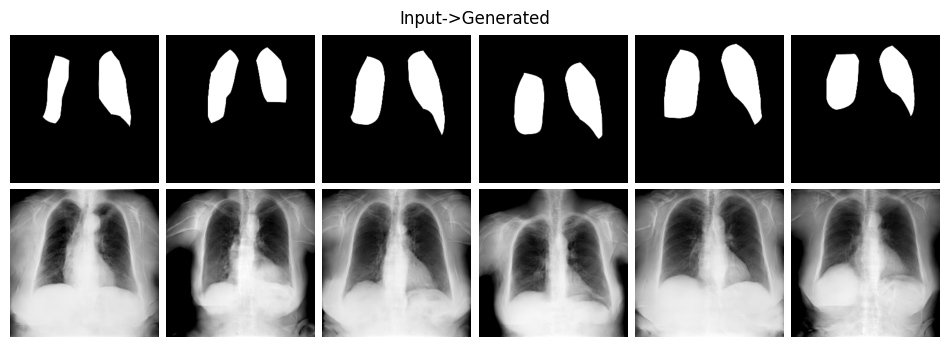

 54%|█████▍    | 27/50 [4:52:22<4:05:30, 640.47s/it]

Epoch [78/100], loss_g: 7.5035, loss_d: 0.6095


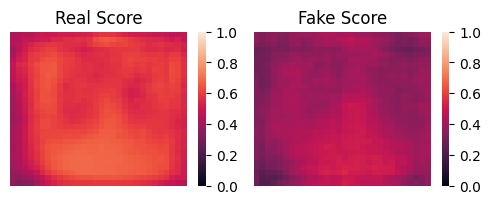

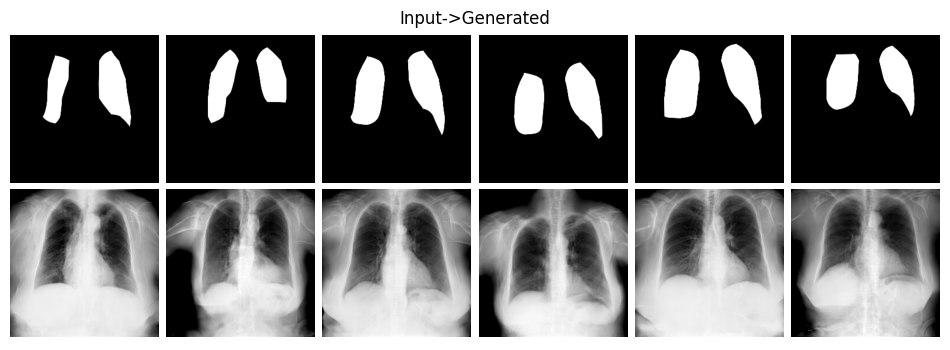

 56%|█████▌    | 28/50 [5:02:59<3:54:31, 639.61s/it]

Epoch [79/100], loss_g: 7.9035, loss_d: 0.5556


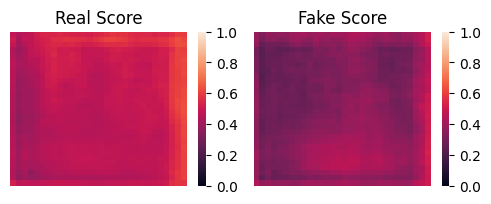

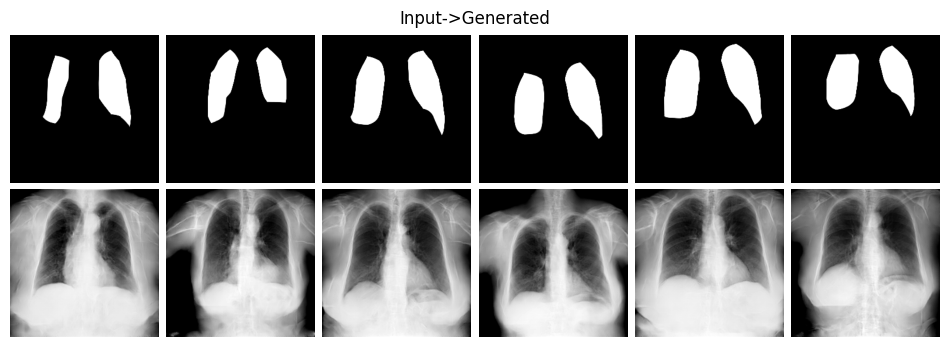

 58%|█████▊    | 29/50 [5:13:37<3:43:41, 639.14s/it]

Epoch [80/100], loss_g: 7.8197, loss_d: 0.6165


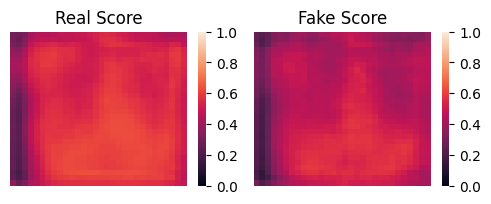

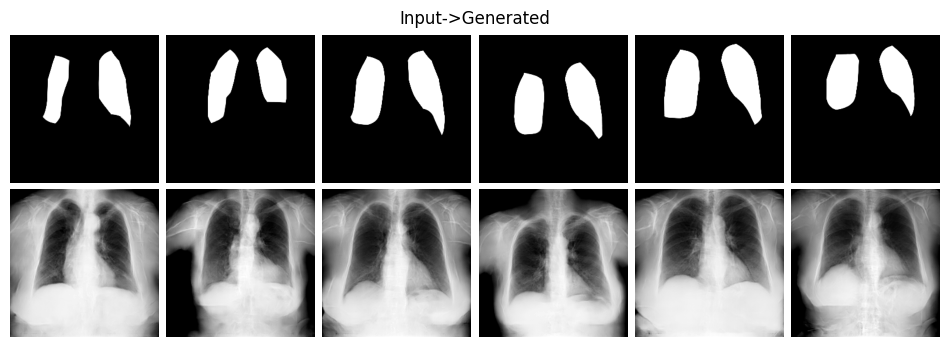

Saving models


 60%|██████    | 30/50 [5:24:16<3:32:56, 638.84s/it]

Models saved! Epoch: 80
Epoch [81/100], loss_g: 7.6144, loss_d: 0.5733


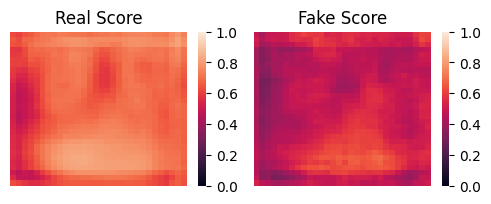

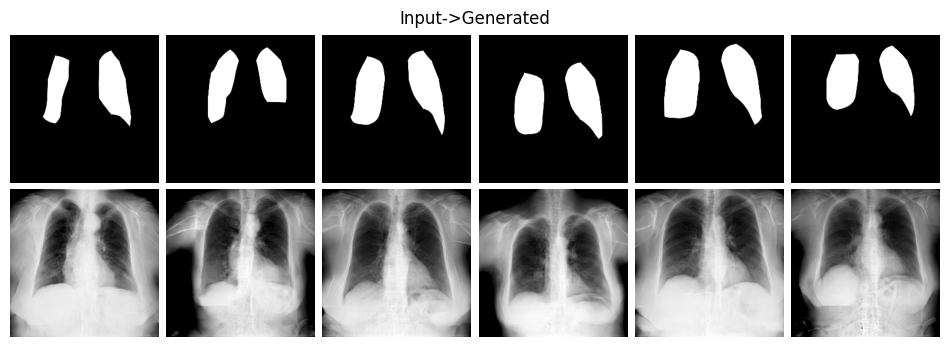

 62%|██████▏   | 31/50 [5:34:53<3:22:08, 638.33s/it]

Epoch [82/100], loss_g: 7.8713, loss_d: 0.5698


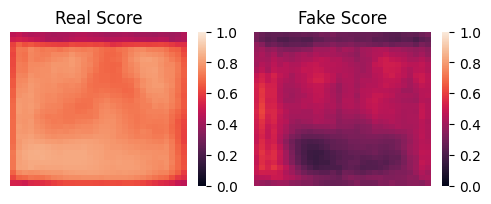

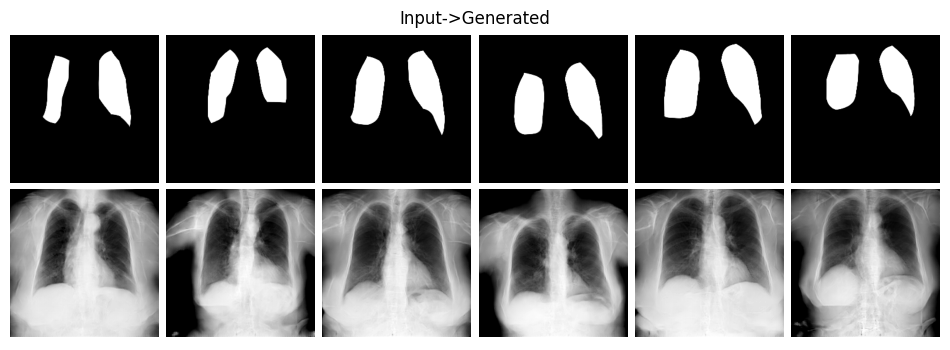

 64%|██████▍   | 32/50 [5:45:31<3:11:29, 638.31s/it]

Epoch [83/100], loss_g: 7.9660, loss_d: 0.5480


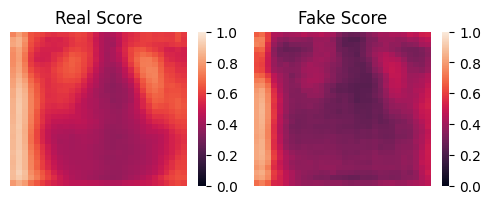

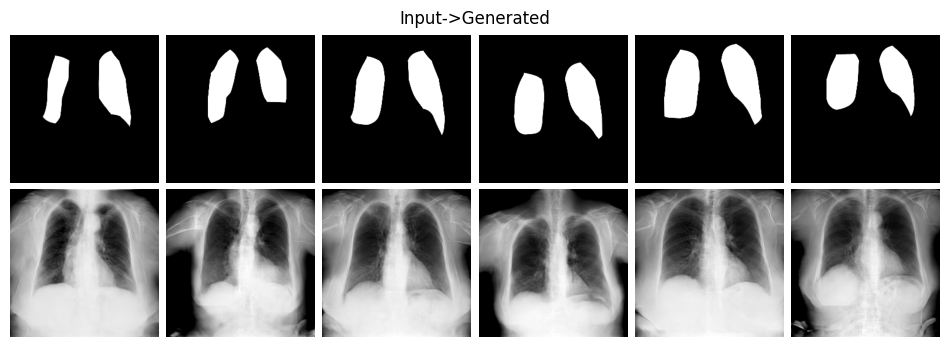

 66%|██████▌   | 33/50 [5:56:12<3:01:04, 639.06s/it]

Epoch [84/100], loss_g: 7.7057, loss_d: 0.6488


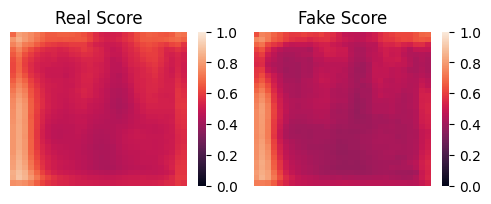

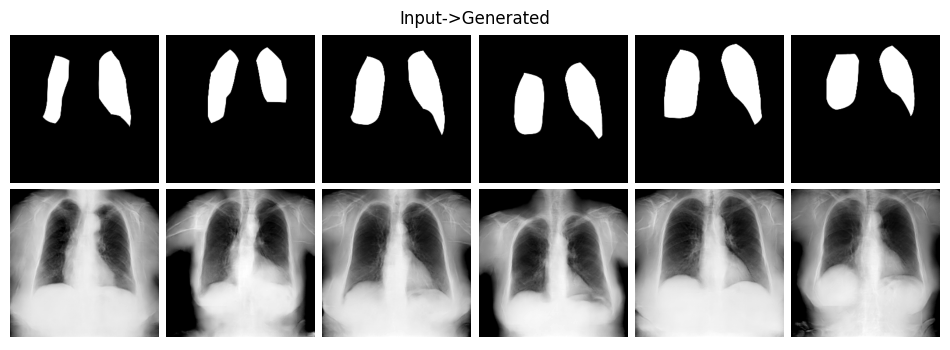

 68%|██████▊   | 34/50 [6:06:49<2:50:16, 638.56s/it]

Epoch [85/100], loss_g: 7.2500, loss_d: 0.5993


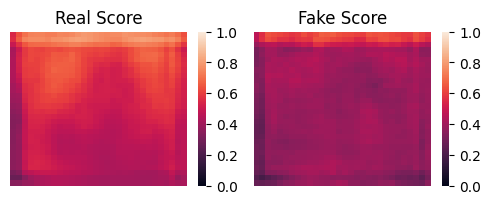

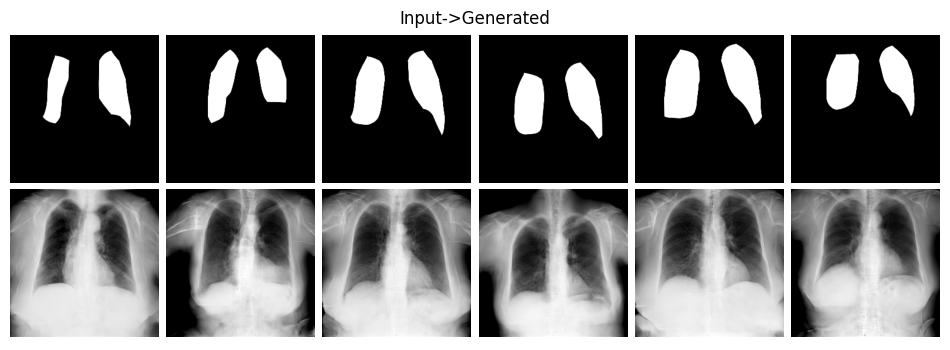

Saving models


 70%|███████   | 35/50 [6:17:30<2:39:46, 639.11s/it]

Models saved! Epoch: 85
Epoch [86/100], loss_g: 7.4975, loss_d: 0.5859


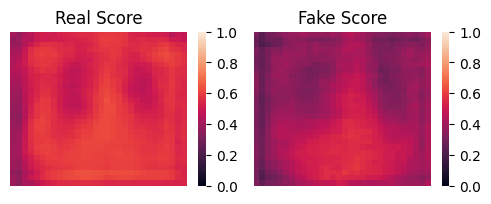

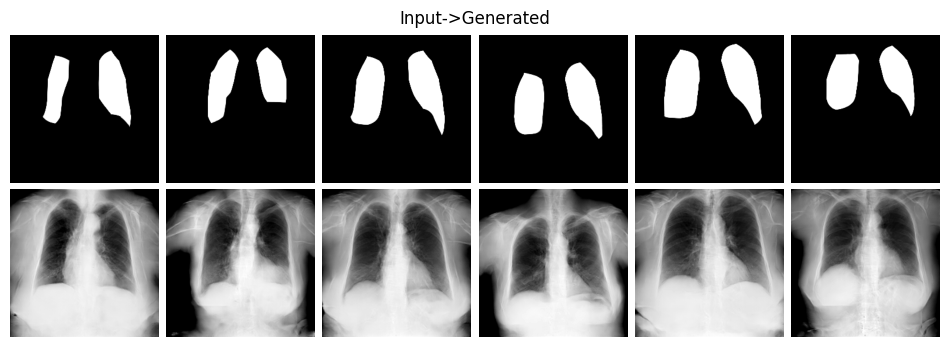

 72%|███████▏  | 36/50 [6:28:10<2:29:13, 639.57s/it]

Epoch [87/100], loss_g: 7.7223, loss_d: 0.5376


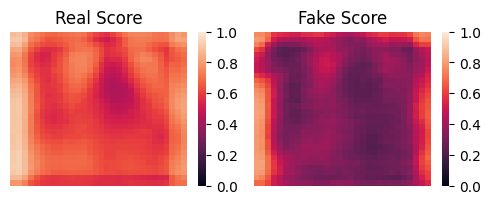

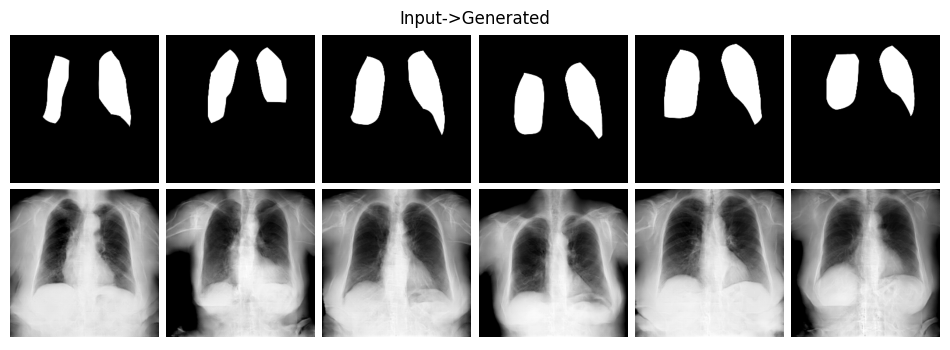

 74%|███████▍  | 37/50 [6:38:51<2:18:40, 640.04s/it]

Epoch [88/100], loss_g: 7.6535, loss_d: 0.5758


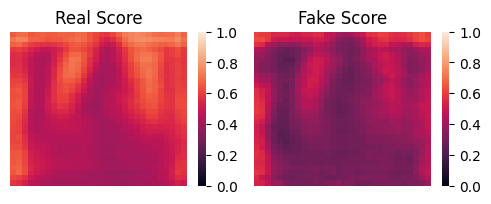

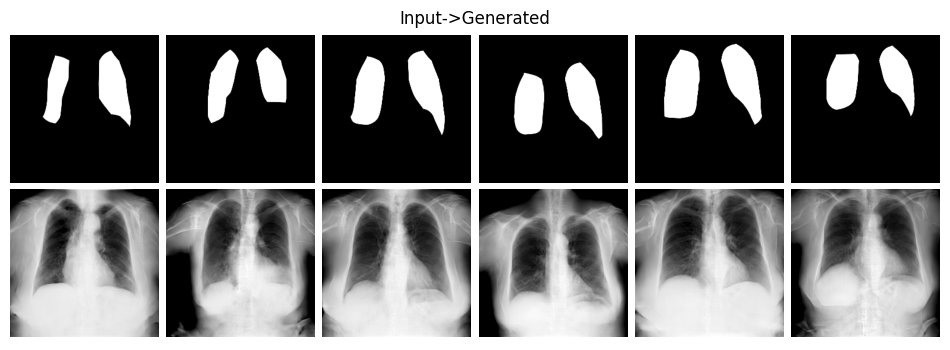

 76%|███████▌  | 38/50 [6:49:29<2:07:51, 639.27s/it]

Epoch [89/100], loss_g: 7.5741, loss_d: 0.5475


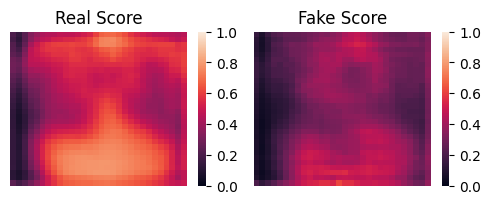

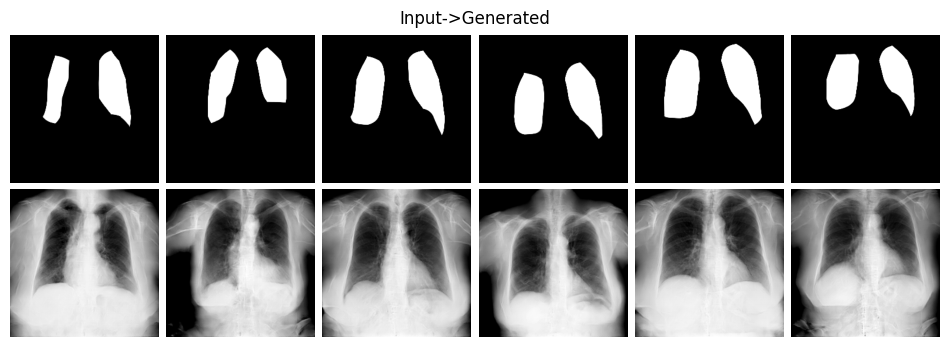

 78%|███████▊  | 39/50 [7:00:06<1:57:03, 638.54s/it]

Epoch [90/100], loss_g: 7.4802, loss_d: 0.5961


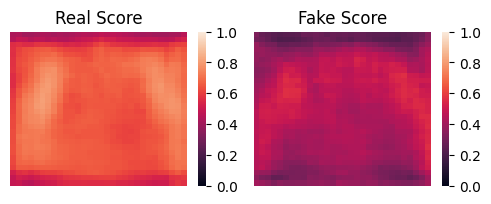

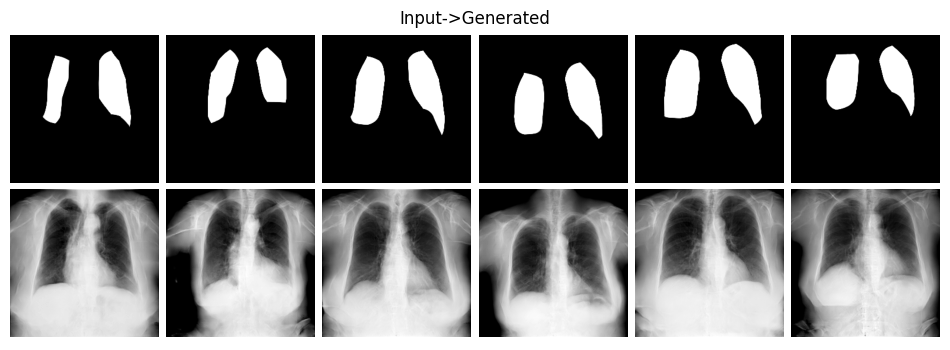

Saving models


 80%|████████  | 40/50 [7:10:52<1:46:47, 640.78s/it]

Models saved! Epoch: 90
Epoch [91/100], loss_g: 7.8008, loss_d: 0.5378


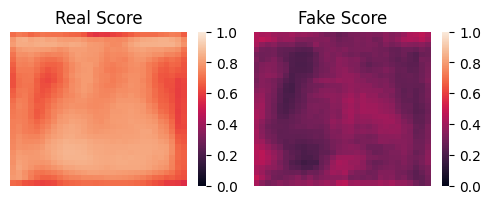

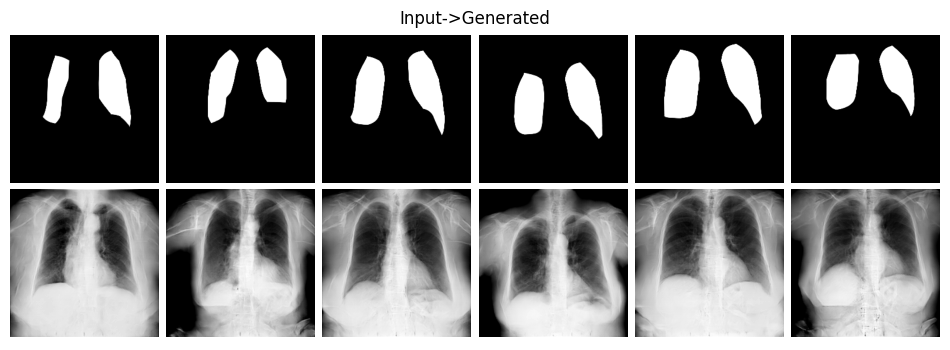

 82%|████████▏ | 41/50 [7:21:32<1:36:05, 640.63s/it]

Epoch [92/100], loss_g: 7.5717, loss_d: 0.5434


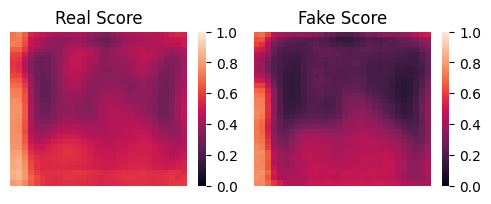

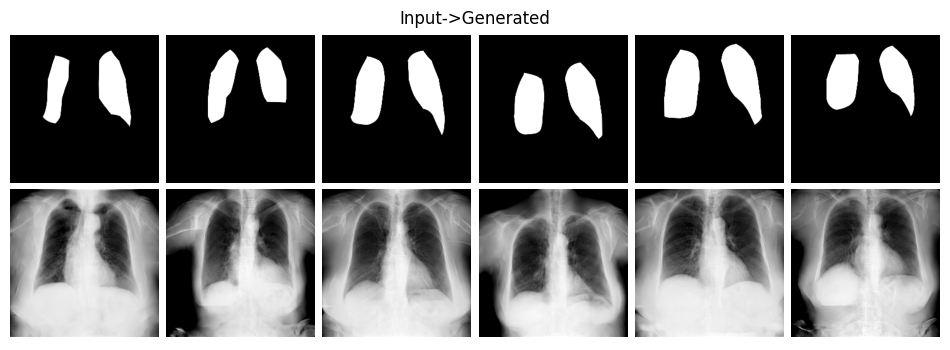

 84%|████████▍ | 42/50 [7:32:11<1:25:21, 640.13s/it]

Epoch [93/100], loss_g: 7.2881, loss_d: 1.4054


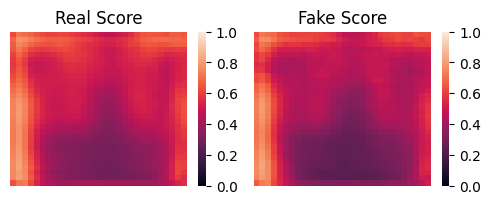

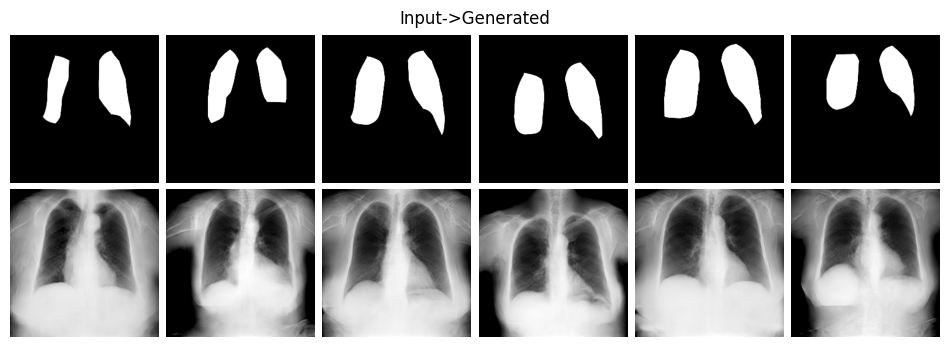

 86%|████████▌ | 43/50 [7:42:50<1:14:37, 639.68s/it]

Epoch [94/100], loss_g: 6.8102, loss_d: 0.7161


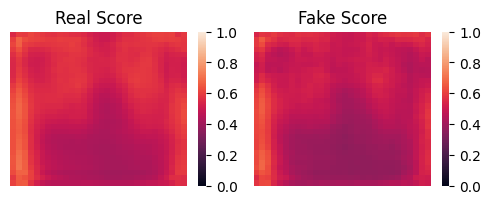

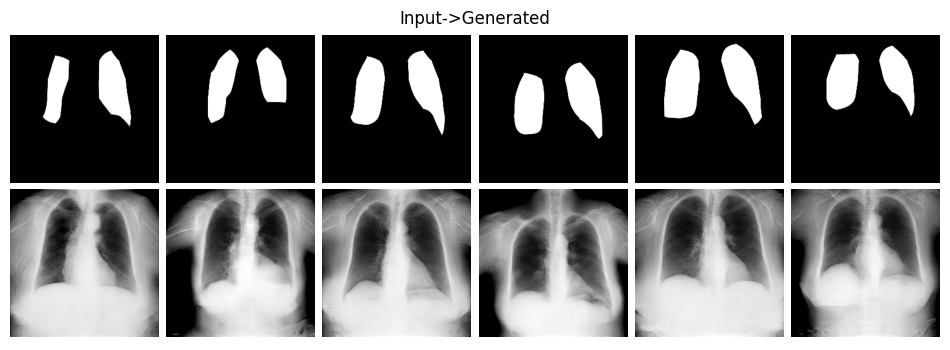

 88%|████████▊ | 44/50 [7:53:28<1:03:55, 639.31s/it]

Epoch [95/100], loss_g: 6.7688, loss_d: 0.6602


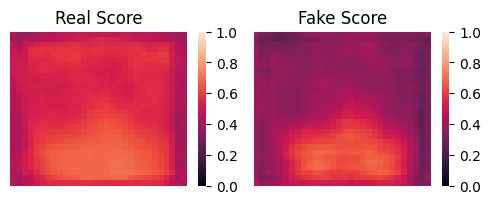

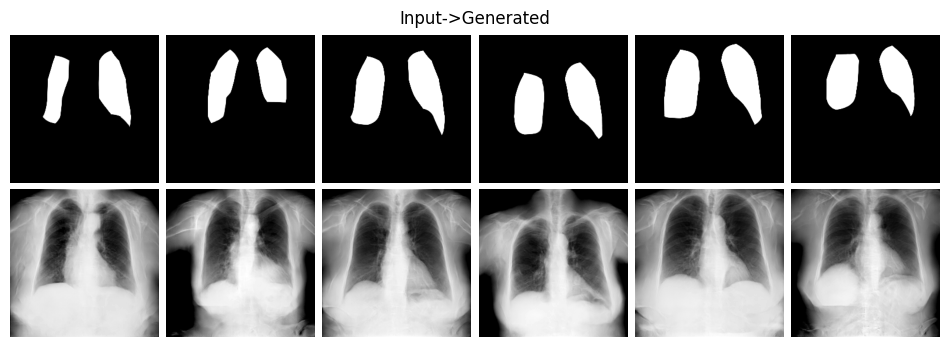

Saving models


 90%|█████████ | 45/50 [8:04:07<53:16, 639.21s/it]  

Models saved! Epoch: 95
Epoch [96/100], loss_g: 7.0262, loss_d: 0.5976


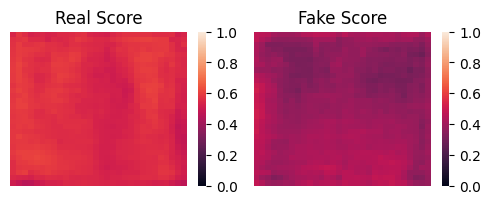

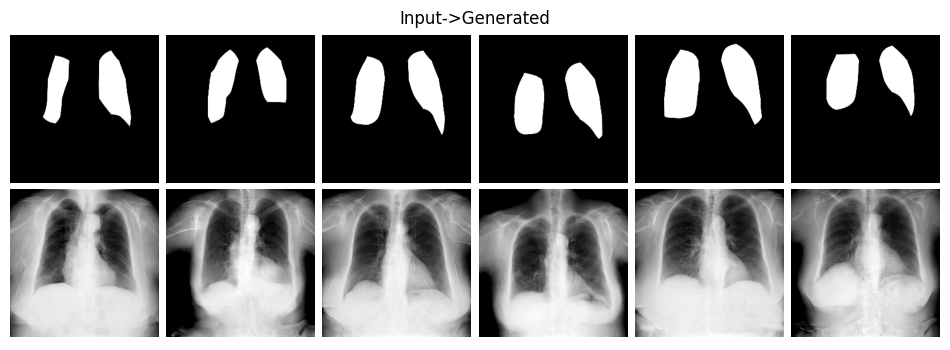

 92%|█████████▏| 46/50 [8:14:46<42:36, 639.21s/it]

Epoch [97/100], loss_g: 7.2776, loss_d: 0.5529


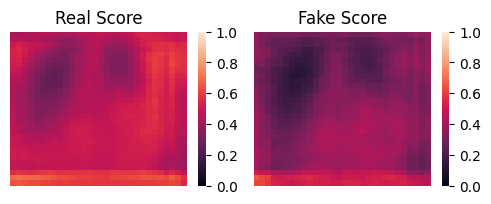

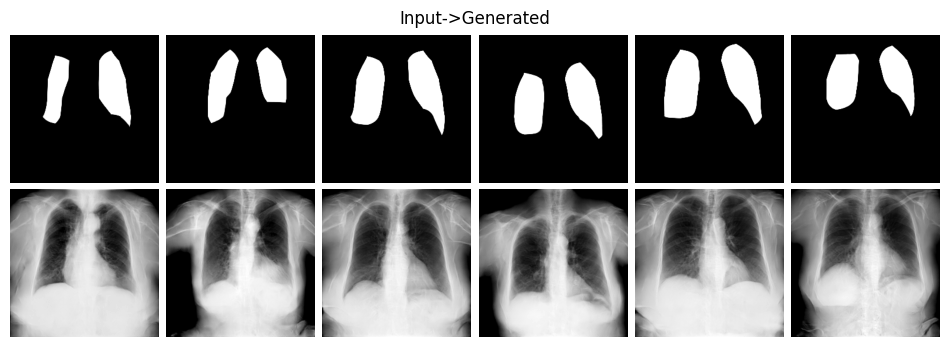

 94%|█████████▍| 47/50 [8:25:29<32:00, 640.28s/it]

Epoch [98/100], loss_g: 7.4085, loss_d: 0.5733


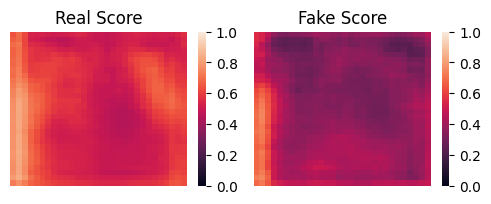

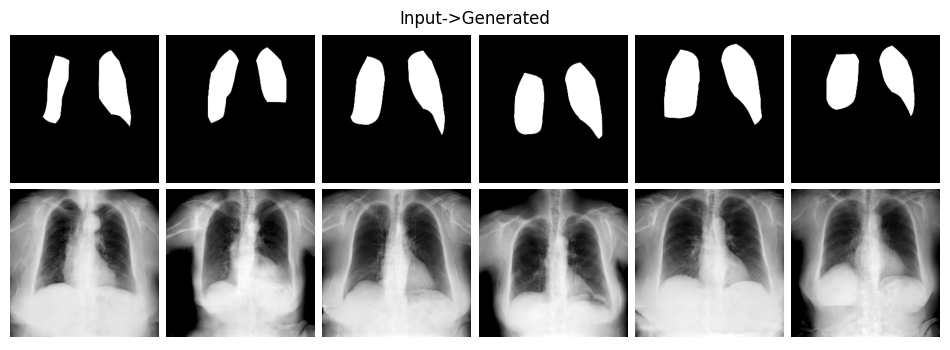

 96%|█████████▌| 48/50 [8:36:33<21:34, 647.40s/it]

Epoch [99/100], loss_g: 7.4464, loss_d: 0.5298


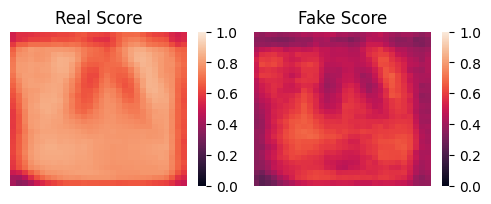

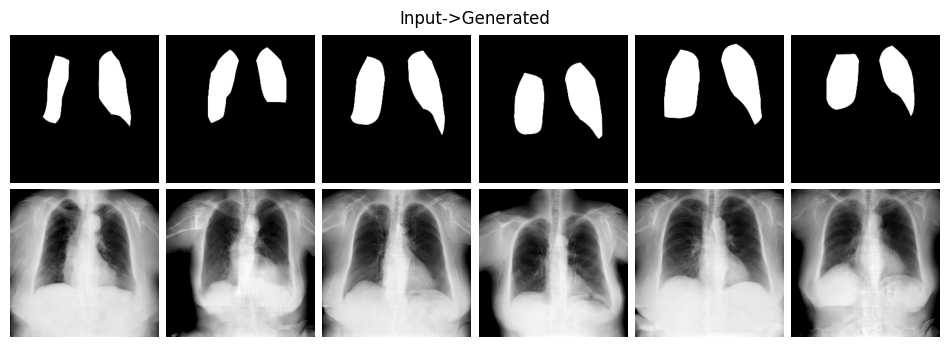

 98%|█████████▊| 49/50 [8:47:11<10:44, 644.58s/it]

Epoch [100/100], loss_g: 7.0383, loss_d: 0.6662


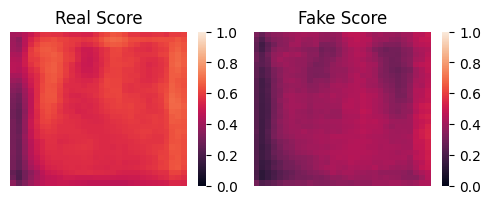

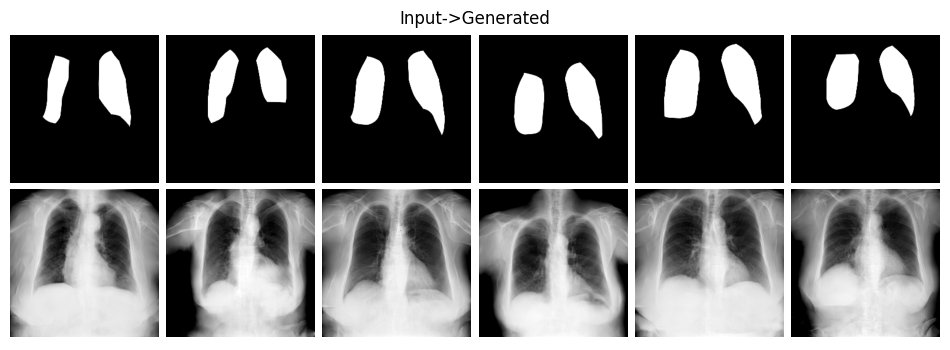

Saving models


100%|██████████| 50/50 [8:57:49<00:00, 645.39s/it]

Models saved! Epoch: 100


In [25]:
losses_g, losses_d, losses_g_per_batch, losses_d_per_batch, mean_scores_fake, mean_scores_real, mean_scores_fake_per_batch, mean_scores_real_per_batch=fit(model,criterion,epochs,lr,epochs_start = EPOCH_START)

In [26]:
with open('losses_g.txt', 'w') as f:
    for e in losses_g:
        f.write(str(e)+' ')

with open('losses_d.txt', 'w') as f:
    for e in losses_d:
        f.write(str(e)+' ')

with open('losses_g_per_batch.txt', 'w') as f:
    for e in losses_g_per_batch:
        f.write(str(e)+' ')
        
with open('losses_d_per_batch.txt', 'w') as f:
    for e in losses_d_per_batch:
        f.write(str(e)+' ')
        
with open('mean_scores_fake.txt', 'w') as f:
    for e in mean_scores_fake:
        f.write(str(e)+' ')
        
with open('mean_scores_real.txt', 'w') as f:
    for e in mean_scores_real:
        f.write(str(e)+' ')

with open('mean_scores_fake_per_batch.txt', 'w') as f:
    for e in mean_scores_fake_per_batch:
        f.write(str(e)+' ')
        
with open('mean_scores_real_per_batch.txt', 'w') as f:
    for e in mean_scores_real_per_batch:
        f.write(str(e)+' ')